In [89]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import seaborn as sns
from sklearn.model_selection import train_test_split

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs 

In [3]:
img = plt.imread("tulips_ds.jpg")

(320, 240, 3)


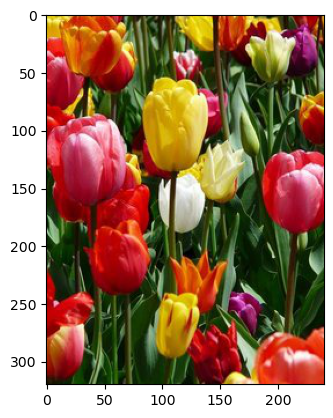

In [7]:
print(img.shape)
plt.imshow(img)
plt.axis("off");

In [13]:
#flat the image so that each row represent a single pixel
img_flat = img.reshape(img.shape[0]*img.shape[1],3)
img_flat[:,:]

array([[211, 196,  41],
       [199, 180,  24],
       [179, 152,   0],
       ...,
       [220,  50,  27],
       [217,  48,  25],
       [216,  47,  24]], dtype=uint8)

In [16]:
img_flat_df = pd.DataFrame(img_flat, columns =["r","g","b"])
img_flat_df.head()

,r,g,b
0,211,196,41
1,199,180,24
2,179,152,0
3,186,150,0
4,187,143,0


In [25]:
#3D plot with each pixel using the df as markers with their colors 
# PD: Unnecesary, but interesting also can be useful someday
trace = go.Scatter3d(x = img_flat_df.r, 
                     y = img_flat_df.g, 
                     z = img_flat_df.b,
                     mode= "markers",
                     marker=dict(size=1,
                                 color = ["rgb({},{},{})".format(r,g,b) for r,g,b
                                 in zip(img_flat_df.r.values, 
                                        img_flat_df.g.values, 
                                        img_flat_df.b.values)],
                                 opacity=0.5))
data = [trace]
layout = go.Layout(margin=dict(l=0,r=0,b=0,t=0))
fig = go.Figure(data=data, layout=layout)
fig.update_layout(scene = dict(xaxis_title="R",yaxis_title="G",zaxis_title="B"))

fig.show()

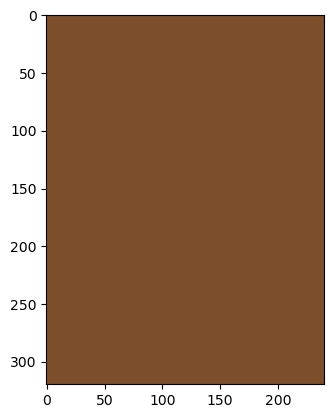

In [33]:
#Experiment for  clusters = 1, for fun
kmeans = KMeans(n_clusters = 1, random_state=42).fit(img_flat)
img_flat_1 = img_flat.copy()
for i in np.unique(kmeans.labels_):
    img_flat_1[kmeans.labels_==i,:] = kmeans.cluster_centers_[i]
img1= img_flat_1.reshape(img.shape)

plt.imshow(img1)
#It works as the median,

In [49]:
#Real work
kmeans3 = KMeans(n_clusters = 3, random_state=42).fit(img_flat)
#Checking the labels from kmeans
np.unique(kmeans3.labels_)

array([0, 1, 2])

In [47]:
#Practice of functions , ### WIP
def show_swatch(RGB_value):
    R, G, B = RGB_value
    rgb =[[np.array([R,G,B]).astype("uint8")]]
    plt.figure()
    plt.imshow(rgb)
    plt.axis("off");

In [52]:
#Practice of functions , ### WIP
for pixel in centers:
    show_swatch(pixel)

TypeError: cannot unpack non-iterable numpy.int32 object

 In most cases the problems will not be able to being represented in 2D or 3D, then this metrics will be useful.
 
Ex1.- Inertia, not like Physics, but the sum of squared distances betweeen each observation and his nearest centroid.
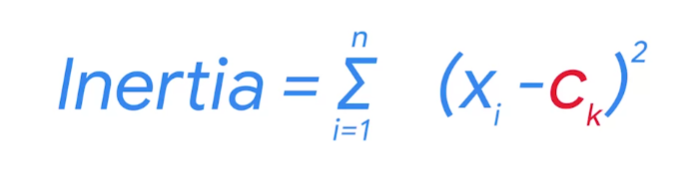
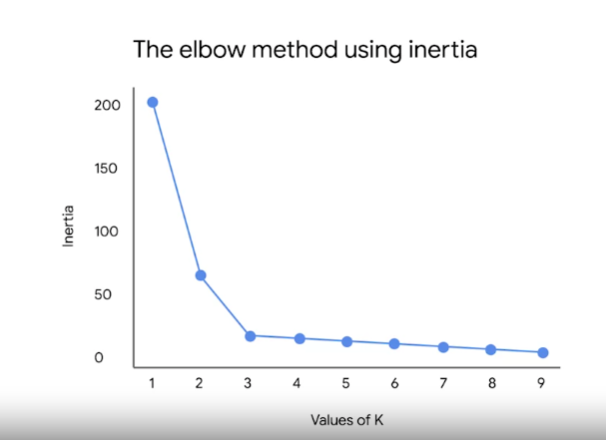

Ex2.- Silhouette score, the mean of the coefficients 
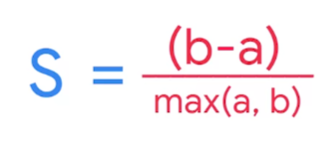
b = is the mean distance from that observation to each observation in the next closest cluster
a = a is the mean distance from that observation to all other observations in the same cluster
Can go from -1 to +1
Near to 1, near the cluster...near 0 means its in the boundaries and near to -1 far away and near to another cluster
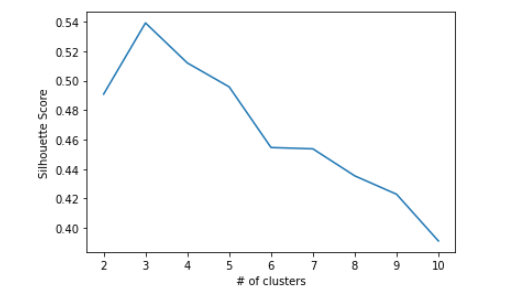

In [64]:
###Working with data without knowing clusters , this time working with syntetic data (Im creating a random data set for example)
rng = np.random.default_rng(seed=44)
centers = rng.integers(low=3, high=7)
X,y,z = make_blobs(n_samples=1000, n_features=6, centers=centers, return_centers=True, random_state=42 )
#This data will have 6 dimensions so is hard to visualize it
X = pd.DataFrame(X)
X.head()

,0,1,2,3,4,5
0,-1.534288,5.467808,-6.945988,1.403934,1.553836,-7.618236
1,-6.681020,6.717808,2.764396,4.460744,-8.286569,10.959708
2,-8.678310,7.825306,3.139699,5.609951,-9.948079,8.072149
3,-6.667385,7.147637,2.145505,4.712937,-9.544708,11.093248
4,-2.753835,-4.209968,0.620345,-7.439505,-4.405723,-2.046149


#Scaling data for easier working
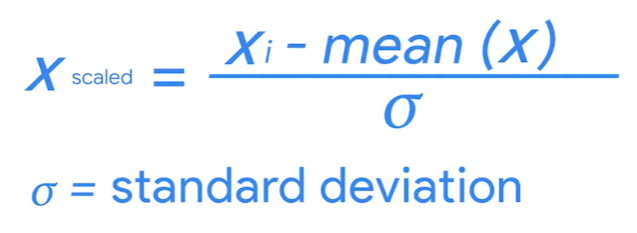

In [68]:
X_scaled = StandardScaler().fit_transform(X)
X_scaled[:2,:]

array([[-0.03173691,  0.4864719 , -1.32178135,  0.59808997,  1.5703227 ,
        -0.88951855],
       [-1.05006137,  0.68381835,  0.74465777,  1.2564266 , -0.97057774,
         1.92995522]])

In [69]:
kmeans3_s = KMeans(n_clusters=3, random_state=42)

In [71]:
kmeans3_s.fit(X_scaled)

KMeans(n_clusters=3, random_state=42)

In [72]:
print("Clusters:", kmeans3_s.labels_)
print("Clusters:", kmeans3_s.inertia_)

Clusters: [1 2 2 2 0 0 0 2 2 1 0 2 2 1 2 2 2 2 0 0 0 2 2 2 1 1 0 2 2 0 0 2 0 0 1 1 0
 2 2 2 0 2 0 2 2 0 0 1 2 1 0 0 0 1 1 1 0 2 0 1 0 0 0 0 0 0 0 1 0 0 2 0 0 0
 2 0 2 1 1 2 1 2 0 1 0 2 1 1 2 1 2 0 1 2 0 1 0 2 2 0 0 2 2 2 2 2 2 0 0 2 1
 0 2 0 2 2 0 0 1 0 0 0 2 0 0 2 2 0 1 2 1 1 1 0 2 1 1 0 2 0 0 0 2 1 1 1 0 0
 2 0 0 2 0 0 2 2 1 2 1 2 2 0 2 2 2 2 0 0 2 0 2 2 0 2 2 1 2 2 1 1 0 2 0 2 0
 2 1 2 1 2 0 0 0 2 2 2 1 1 2 0 2 2 0 2 0 0 0 0 0 1 0 1 2 2 0 1 1 2 0 0 1 0
 2 2 2 2 0 0 0 2 1 0 1 2 1 2 1 0 0 2 2 2 1 1 0 0 1 1 1 2 2 2 0 0 0 2 2 2 0
 2 0 1 0 2 2 1 1 0 0 2 0 1 2 0 2 2 2 2 0 2 2 0 2 2 0 0 0 0 0 2 1 0 2 0 1 1
 0 2 2 0 2 2 2 2 2 2 1 2 1 0 2 2 1 0 0 2 0 2 2 1 2 0 2 2 2 0 0 0 1 1 1 0 1
 1 1 2 2 1 2 1 0 2 0 1 2 1 0 2 0 2 2 2 2 0 0 2 0 2 0 0 0 1 2 2 2 2 2 0 0 1
 0 2 2 0 2 0 0 2 0 2 1 2 2 0 2 0 0 1 2 0 0 0 1 0 0 2 0 2 0 2 1 2 0 2 2 0 0
 1 2 0 0 1 0 0 2 2 2 2 0 2 0 2 2 1 1 0 1 0 0 0 2 2 1 0 2 2 2 0 2 0 2 1 2 0
 1 0 0 0 2 0 1 2 0 1 2 2 0 0 0 0 0 2 2 0 2 2 0 2 2 0 0 1 0 1 2 0 0 0 0 1 2
 2 0 2 2 1 1 2 

In [80]:
#Calculing Inertia for diferent ammounts of clusters
num_clusters = [i for i in range(2,11)]

In [91]:
def kmeans_inertia(num_clusters, x_vals):
    inertia = []
    for i in num_clusters:
        kms = KMeans(n_clusters = i , random_state=42)
        kms.fit(x_vals)
        inertia.append(kms.inertia_)
    return inertia

Text(0, 0.5, 'Inertia')

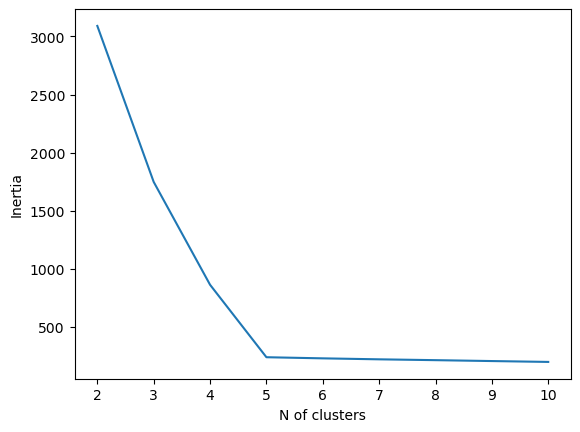

In [93]:
inertia = kmeans_inertia(num_clusters, X_scaled)
plot = sns.lineplot(x=num_clusters, y=inertia)
plot.set_xlabel("N of clusters")
plot.set_ylabel("Inertia")

In [95]:
kmeans3_sil_score = silhouette_score(X_scaled, kmeans3_s.labels_)
kmeans3_sil_score

0.5815196371994132

In [97]:
#Same as Inertia
def kmeans_sil(num_clusters, x_vals):
    silh = []
    for i in num_clusters:
        kms = KMeans(n_clusters = i , random_state=42)
        kms.fit(x_vals)
        sil = silhouette_score(x_vals, kms.labels_)
        silh.append(sil)
    return silh

Text(0, 0.5, 'Sil')

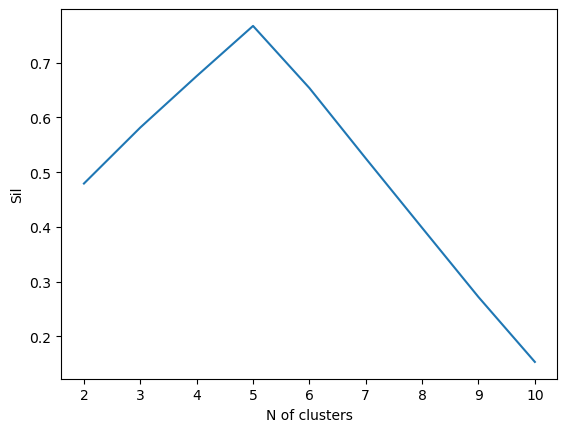

In [100]:
sil = kmeans_sil(num_clusters, X_scaled)
plot = sns.lineplot(x=num_clusters, y=sil)
plot.set_xlabel("N of clusters")
plot.set_ylabel("Sil")

In [101]:
#Checking if its correct 
centers

5

In [102]:
kmeans5 = KMeans(n_clusters = 5, random_state=42)
kmeans5.fit(X_scaled)
#Checking the labels from kmeans
np.unique(kmeans5.labels_)

array([0, 1, 2, 3, 4])

In [104]:
X["Cluster"] = kmeans5.labels_
X.head()

,0,1,2,3,4,5,Cluster
0,-1.534288,5.467808,-6.945988,1.403934,1.553836,-7.618236,3
1,-6.681020,6.717808,2.764396,4.460744,-8.286569,10.959708,2
2,-8.678310,7.825306,3.139699,5.609951,-9.948079,8.072149,2
3,-6.667385,7.147637,2.145505,4.712937,-9.544708,11.093248,2
4,-2.753835,-4.209968,0.620345,-7.439505,-4.405723,-2.046149,1
